In [1]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style= "darkgrid", color_codes = True)
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout, Input
from keras.regularizers import l2
from tensorflow.keras.metrics import Precision, Recall, BinaryAccuracy
from sklearn.metrics import roc_curve, auc
from tensorflow.keras.preprocessing.image import  load_img
import warnings
warnings.filterwarnings('ignore')

2024-05-15 19:29:37.247611: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-15 19:29:37.247710: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-15 19:29:37.389121: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
class myCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs={}):
    if(logs.get('val_accuracy')>0.98):
      print("\nReached 98% accuracy so cancelling training!")
      self.model.stop_training = True

In [3]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

import os
import zipfile


IMAGE_SIZE = [150, 150]

train_datagen = ImageDataGenerator(rescale = 1./255.,
                                    rotation_range = 20,
                                    width_shift_range = 0.1,
                                    height_shift_range = 0.1,
                                    shear_range = 0.1,
                                    zoom_range = 0.1,
                                    horizontal_flip = True
                                   
                                   )

test_datagen = ImageDataGenerator( rescale = 1.0/255. )

train_generator = train_datagen.flow_from_directory('../input/chest-xray-pneumonia/chest_xray/chest_xray/train',
                                                    batch_size = 32,
                                                    class_mode = 'categorical', 
                                                    target_size = (150, 150))     

validation_generator =  test_datagen.flow_from_directory( '../input/chest-xray-pneumonia/chest_xray/chest_xray/val',
                                                          batch_size  = 32,
                                                          class_mode  = 'categorical', 
                                                          target_size = (150, 150),
                                                          shuffle = False 
                                                    )

test_generator = test_datagen.flow_from_directory('../input/chest-xray-pneumonia/chest_xray/chest_xray/test',
    batch_size=32,
    class_mode='categorical', 
    target_size=(150, 150),
    shuffle=False
)

Found 5216 images belonging to 2 classes.
Found 16 images belonging to 2 classes.
Found 624 images belonging to 2 classes.


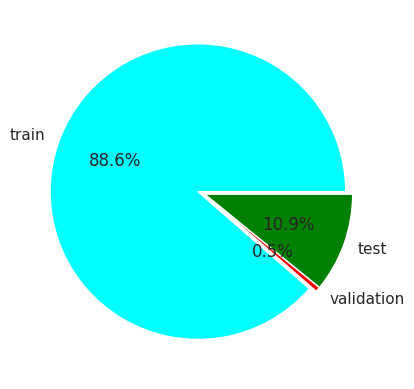

<Figure size 640x480 with 0 Axes>

In [4]:
plt.pie([len(train_generator), len(validation_generator), len(test_generator)],
        labels=['train', 'validation', 'test'], autopct='%.1f%%', colors=['aqua', 'red', 'green'], explode=(0.05, 0, 0))
plt.show()
plt.savefig('dataset_pie.png')

In [5]:
print(train_generator.class_indices)
print(test_generator.class_indices)
print(validation_generator.class_indices)

{'NORMAL': 0, 'PNEUMONIA': 1}
{'NORMAL': 0, 'PNEUMONIA': 1}
{'NORMAL': 0, 'PNEUMONIA': 1}


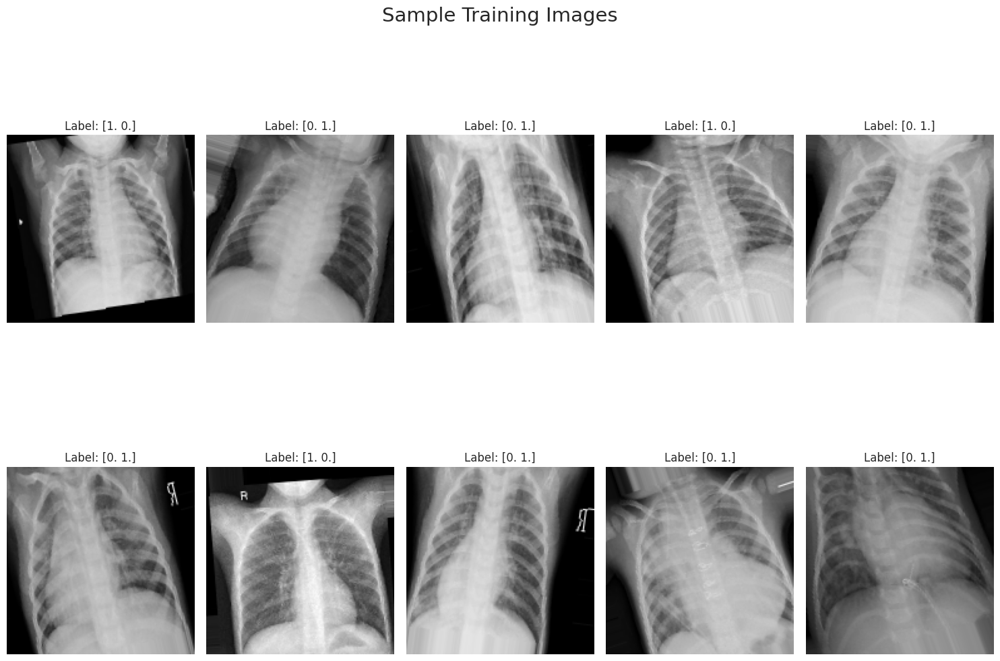

In [6]:
fig, ax = plt.subplots(nrows=2, ncols=5, figsize=(15, 12))
idx = 0

train_data, train_labels = train_generator[0]

for i in range(2):
    for j in range(5):
        label = train_labels[idx]
        ax[i, j].set_title(f"Label: {label}")
        ax[i, j].imshow(train_data[idx])
        ax[i, j].axis("off")
        idx += 1

plt.tight_layout()
plt.suptitle("Sample Training Images", fontsize=21)
plt.show()


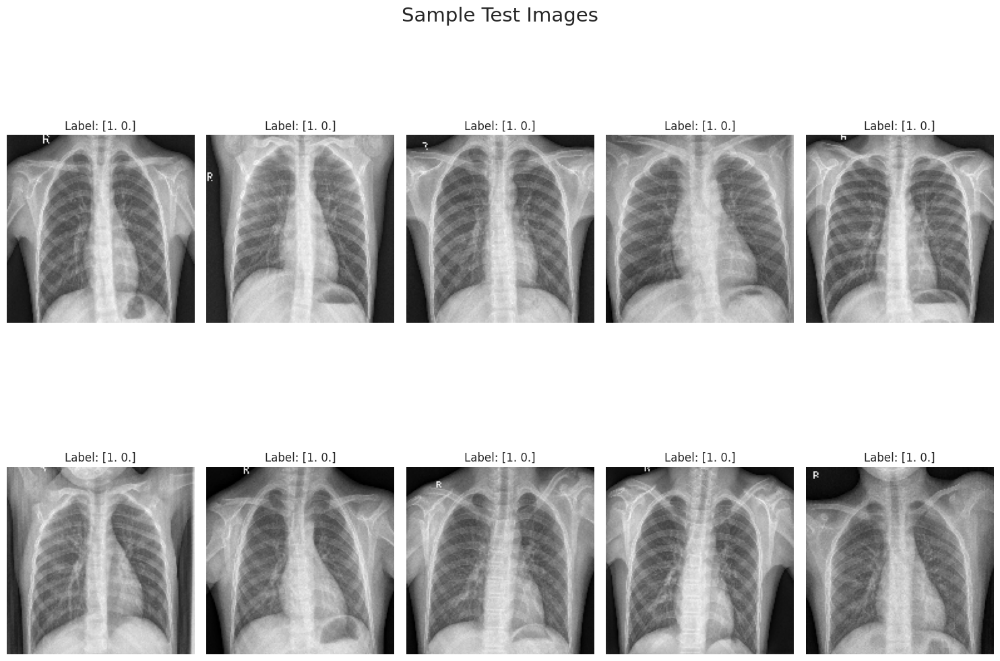

In [7]:
fig, ax = plt.subplots(nrows=2, ncols=5, figsize=(15, 12))
idx = 0

train_data, train_labels = test_generator[0]

for i in range(2):
    for j in range(5):
        label = train_labels[idx]
        ax[i, j].set_title(f"Label: {label}")
        ax[i, j].imshow(train_data[idx])
        ax[i, j].axis("off")
        idx += 1

plt.tight_layout()
plt.suptitle("Sample Test Images", fontsize=21)
plt.show()

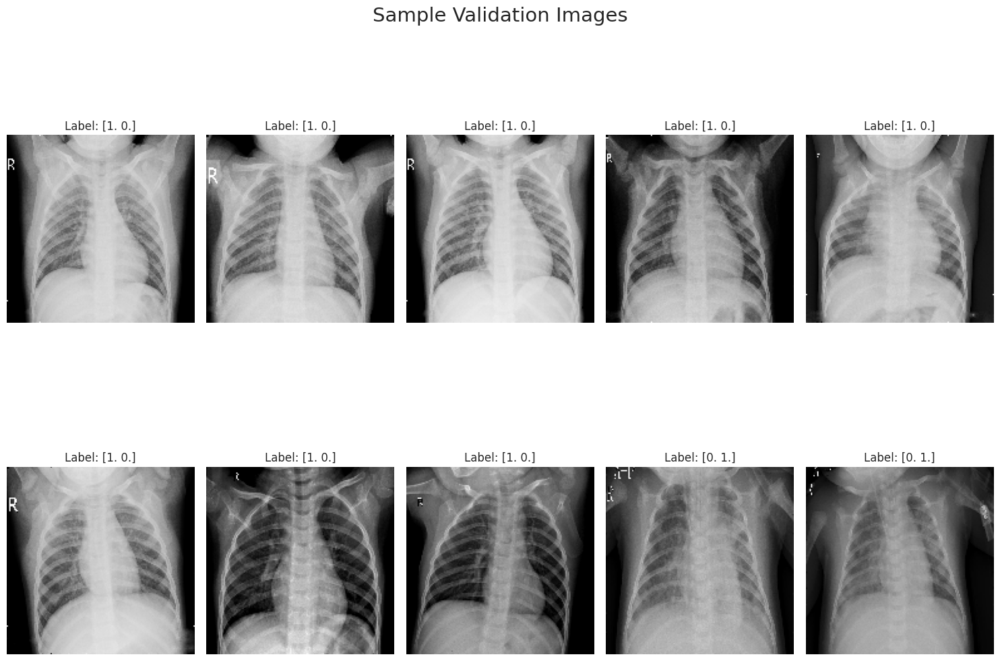

In [8]:
fig, ax = plt.subplots(nrows=2, ncols=5, figsize=(15, 12))
idx = 0

train_data, train_labels = validation_generator[0]

for i in range(2):
    for j in range(5):
        label = train_labels[idx]
        ax[i, j].set_title(f"Label: {label}")
        ax[i, j].imshow(train_data[idx])
        ax[i, j].axis("off")
        idx += 1

plt.tight_layout()
plt.suptitle("Sample Validation Images", fontsize=21)
plt.show()

NORMAL


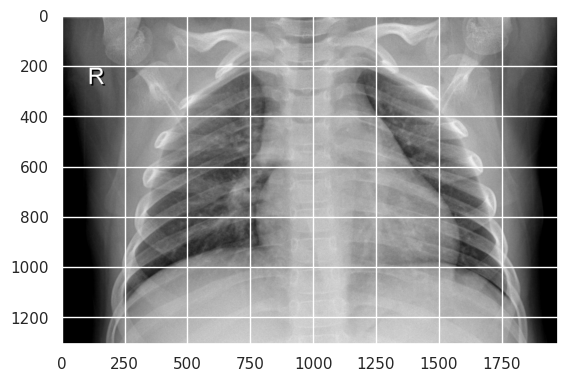

In [9]:
train_normal = load_img("/kaggle/input/chest-xray-pneumonia/chest_xray/train/NORMAL/IM-0127-0001.jpeg")
print("NORMAL")
plt.imshow(train_normal)
plt.show()

NORMAL


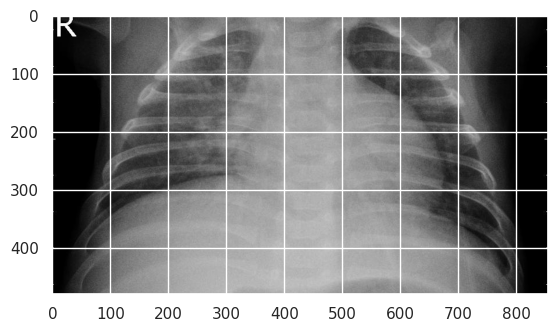

In [10]:
train_pneumonia = load_img("/kaggle/input/chest-xray-pneumonia/chest_xray/train/PNEUMONIA/person1004_virus_1686.jpeg")
print("NORMAL")
plt.imshow(train_pneumonia)
plt.show()

NORMAL


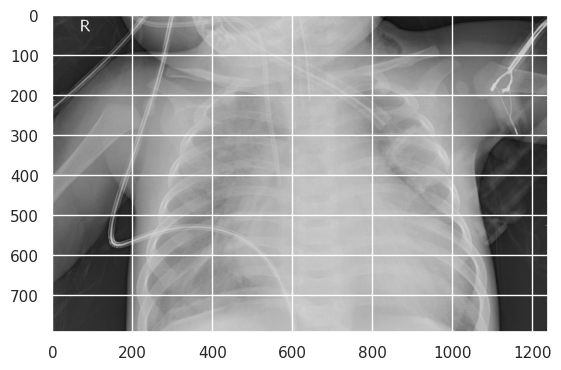

In [11]:
train_pneumonia = load_img("/kaggle/input/chest-xray-pneumonia/chest_xray/train/PNEUMONIA/person1008_bacteria_2939.jpeg")
print("NORMAL")
plt.imshow(train_pneumonia)
plt.show()

In [12]:
import os
import glob

dataset_directory = "/kaggle/input/chest-xray-pneumonia/chest_xray"

datasets = ["train", "test", "val"]
pneumonia_lung = []
normal_lung = []

for dataset in datasets:
    path = os.path.join(dataset_directory, dataset)
    normal = glob.glob(os.path.join(path, "NORMAL/*.jpeg"))
    pneumonia = glob.glob(os.path.join(path, "PNEUMONIA/*.jpeg"))
    normal_lung.extend(normal)
    pneumonia_lung.extend(pneumonia)

print("The number of pneumonia images is", len(pneumonia_lung))
print("The number of non-pneumonia images is", len(normal_lung))


The number of pneumonia images is 4273
The number of non-pneumonia images is 1583


In [13]:
import random

random.shuffle(normal_lung)
random.shuffle(pneumonia_lung)
images = normal_lung[:50] + pneumonia_lung[:50]
images[:10]

['/kaggle/input/chest-xray-pneumonia/chest_xray/train/NORMAL/NORMAL2-IM-0417-0001.jpeg',
 '/kaggle/input/chest-xray-pneumonia/chest_xray/train/NORMAL/IM-0270-0001.jpeg',
 '/kaggle/input/chest-xray-pneumonia/chest_xray/train/NORMAL/NORMAL2-IM-0545-0001.jpeg',
 '/kaggle/input/chest-xray-pneumonia/chest_xray/train/NORMAL/IM-0544-0001.jpeg',
 '/kaggle/input/chest-xray-pneumonia/chest_xray/train/NORMAL/IM-0631-0001.jpeg',
 '/kaggle/input/chest-xray-pneumonia/chest_xray/train/NORMAL/NORMAL2-IM-0557-0001.jpeg',
 '/kaggle/input/chest-xray-pneumonia/chest_xray/test/NORMAL/NORMAL2-IM-0281-0001.jpeg',
 '/kaggle/input/chest-xray-pneumonia/chest_xray/train/NORMAL/IM-0553-0001-0002.jpeg',
 '/kaggle/input/chest-xray-pneumonia/chest_xray/train/NORMAL/IM-0698-0001.jpeg',
 '/kaggle/input/chest-xray-pneumonia/chest_xray/train/NORMAL/NORMAL2-IM-1266-0001.jpeg']

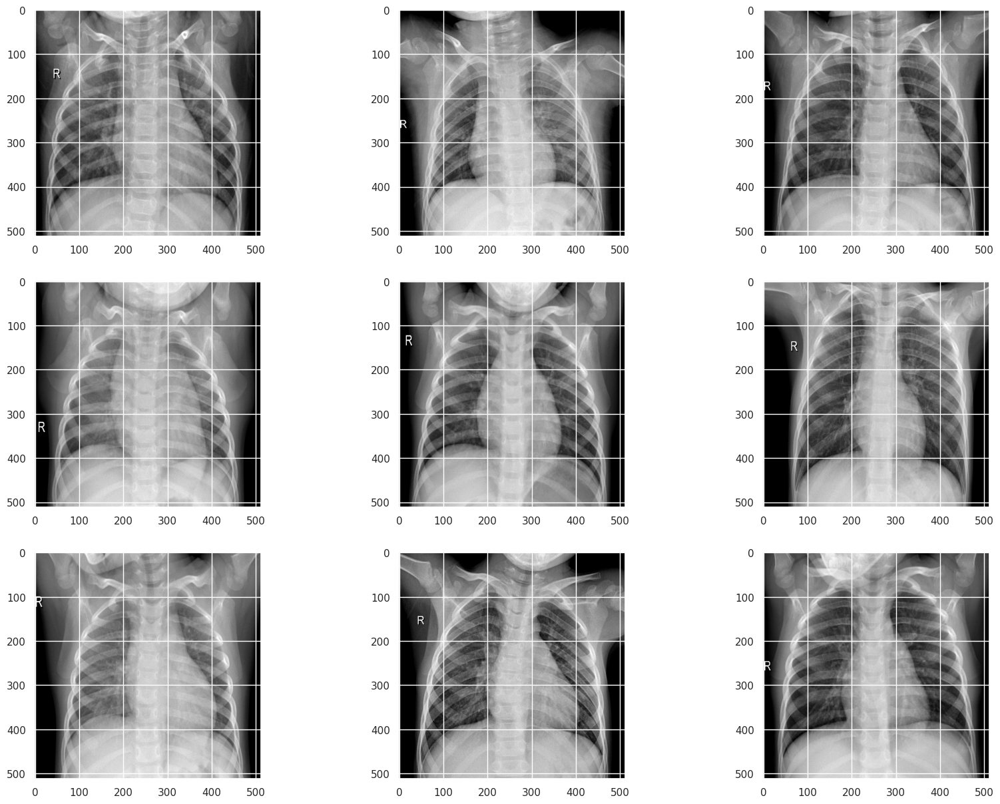

In [14]:
import cv2
fig = plt.figure(figsize = (20, 15))
columns, rows = 3, 3
for i in range(1, 10):
    img = cv2.imread(images[i])
    img = cv2.resize(img, (512, 512))
    fig.add_subplot(rows, columns, i)
    plt.imshow(img)

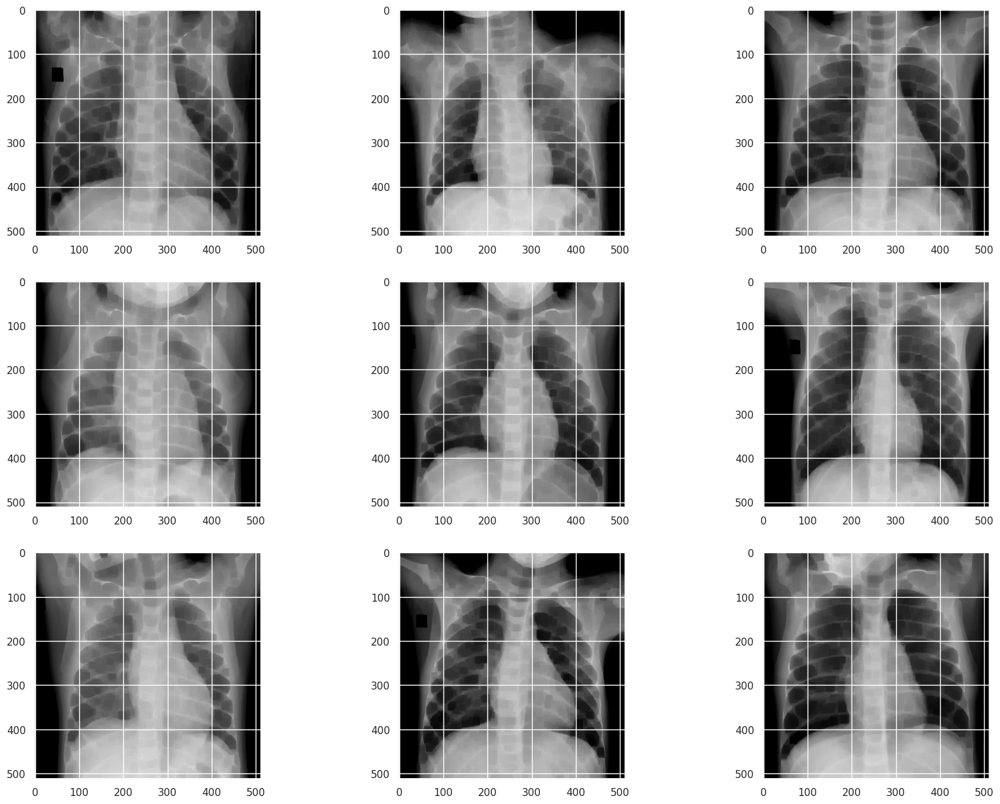

In [15]:
#image erosion 

import numpy as np

fig = plt.figure(figsize = (20, 15))
columns, rows = 3, 3
for i in range(1, 10):
    img = cv2.imread(images[i])
    img = cv2.resize(img, (512, 512))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    kernel = np.ones((5, 5), np.uint8)
    image_erosion = cv2.erode(img, kernel, iterations=3)
    fig.add_subplot(rows, columns, i)
    plt.imshow(image_erosion)

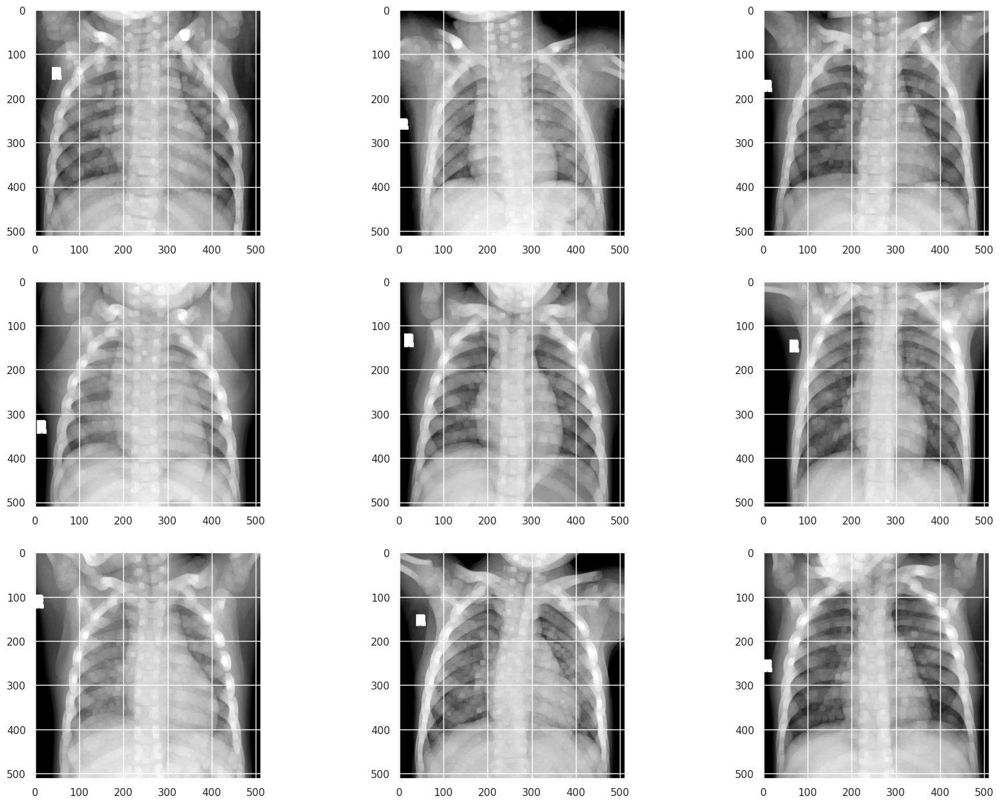

In [16]:
# Image dilation 


fig = plt.figure(figsize = (20, 15))
columns, rows = 3, 3

for i in range(1, 10):
    img = cv2.imread(images[i])
    img = cv2.resize(img, (512, 512))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    kernel = np.ones((5, 5), np.uint8)
    image_dilation = cv2.dilate(img, kernel, iterations = 2)
    fig.add_subplot(rows, columns, i)
    plt.imshow(image_dilation)

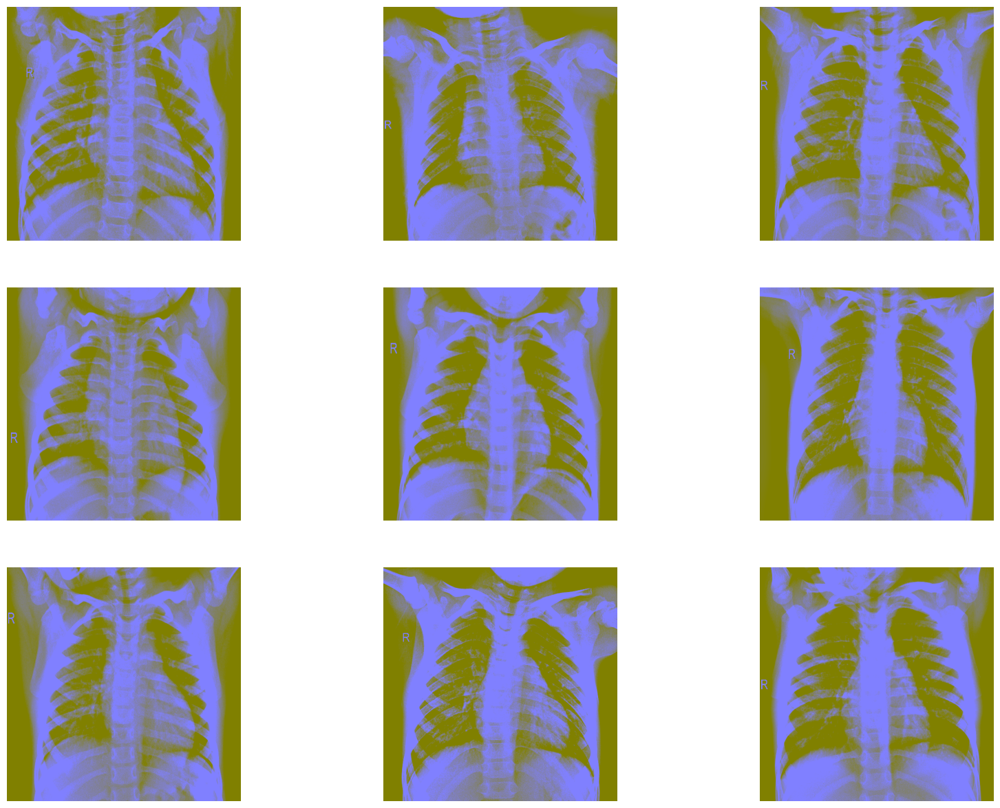

In [17]:
# Convert the images to greyscale and then apply Gaussian blur to them 

fig = plt.figure(figsize = (20, 15))
columns, rows = 3, 3

for i in range(1, 10):
    img = cv2.imread(images[i])
    img = cv2.resize(img, (512, 512))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    img = cv2.addWeighted (img, 4, cv2.GaussianBlur(img, (0, 0), 512/10), -4, 128)
    fig.add_subplot(rows, columns, i)
    plt.imshow(img)
    plt.axis(False)

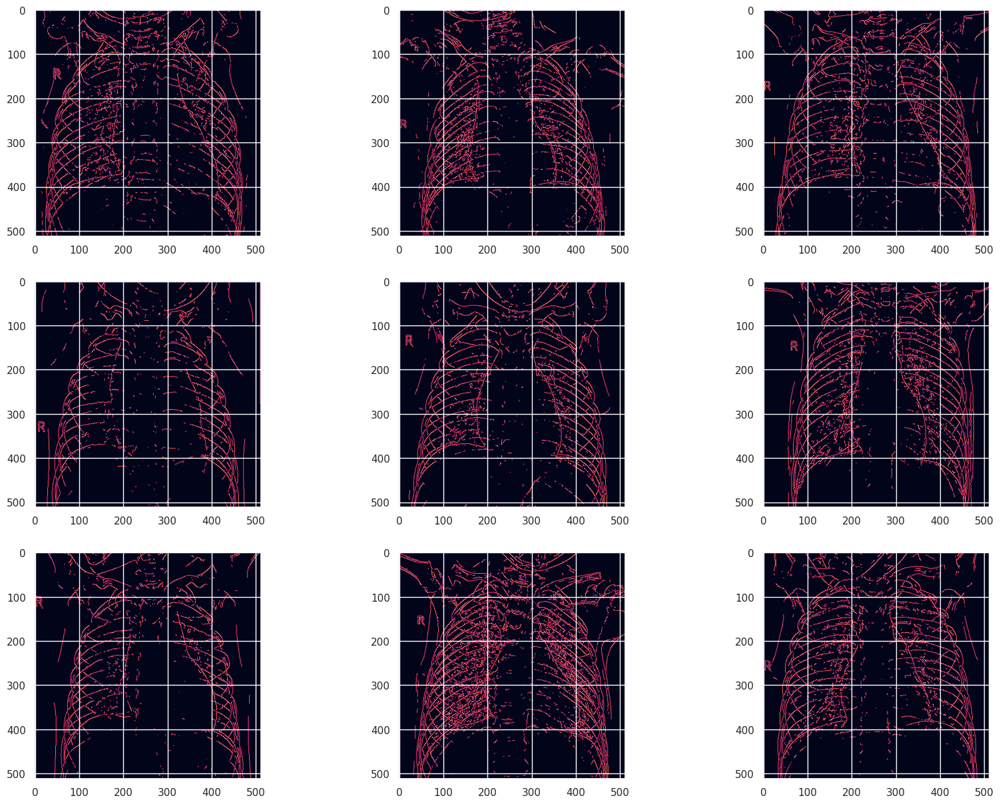

In [18]:
# Canny edge detection: 

fig = plt.figure(figsize = (20, 15))
columns, rows = 3, 3

for i in range(1, 10):
    img = cv2.imread(images[i])
    img = cv2.resize(img, (512, 512))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    detected_edges = cv2.Canny(img, 80, 100)
    fig.add_subplot(rows, columns, i)
    plt.imshow(detected_edges)

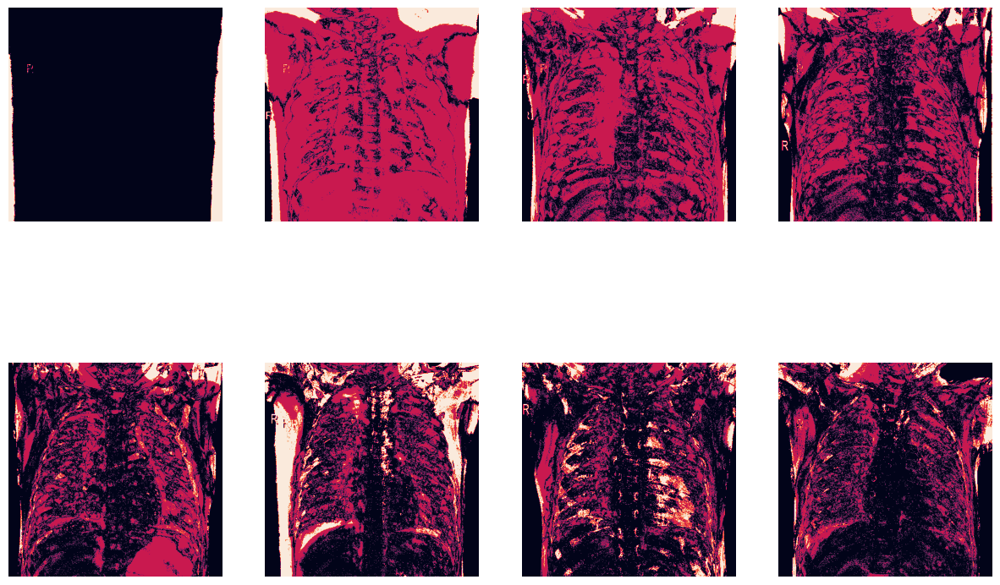

In [19]:
fgbg = cv2.createBackgroundSubtractorMOG2()

fig=plt.figure(figsize=(15, 10))
columns = 4; rows = 2
for i in range(1, columns*rows +1):
    img = cv2.imread(images[i])
    img = cv2.resize(img, (512, 512))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = fgbg.apply(img)
    fig.add_subplot(rows, columns, i)
    plt.imshow(img)
    plt.axis(False)

# CNN Model 1 

In [20]:
import tensorflow as tf

model1 = tf.keras.models.Sequential([
    # This is the first convolution
    tf.keras.layers.Conv2D(16, (3,3), activation='relu', input_shape=(150, 150, 3),name="L1"),
    tf.keras.layers.MaxPooling2D(2, 2),
    
    # The second convolution
    tf.keras.layers.Conv2D(32, (3,3), activation='relu',name="L2"),
    tf.keras.layers.MaxPooling2D(2,2),
    
    # The third convolution
    tf.keras.layers.Conv2D(64, (3,3), activation='relu',name="L3"),
    tf.keras.layers.MaxPooling2D(2,2),

    # Flatten the results to feed into a DNN
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(512, activation='relu',name="dense1" ),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.25),
    # 512 neuron hidden layer
#     tf.keras.layers.Dense(128, activation='relu',name="dense2" ),
#     tf.keras.layers.BatchNormalization(),
#     tf.keras.layers.Dropout(0.25),
    
    tf.keras.layers.Dense(2, activation='sigmoid')
])

# Print the model summary
model1.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ L1 (Conv2D)                     │ (None, 148, 148, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 74, 74, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ L2 (Conv2D)                     │ (None, 72, 72, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 36, 36, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ L3 (Conv2D)                     │ (None, 34, 34, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 17, 17, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 18496)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense1 (Dense)                  │ (None, 512)            │     9,470,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 2)              │         1,026 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 9,497,122 (36.23 MB)

 Trainable params: 9,496,098 (36.22 MB)

 Non-trainable params: 1,024 (4.00 KB)

In [21]:
import time

start = time.time()

model1.compile(optimizer = 'adam',loss = 'binary_crossentropy', metrics = ['accuracy'])

callbacks = myCallback()
history = model1.fit( train_generator, 
                  validation_data = validation_generator, 
                  epochs = 5,  
                  callbacks=[callbacks]
                 
                 )

end = time.time()
elapsed = end - start
print("Total Time:", elapsed)

Epoch 1/5


2024-05-15 19:30:36.819081: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 43808: 7.10448, expected 6.11694
2024-05-15 19:30:36.819138: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 43809: 7.52163, expected 6.53409
2024-05-15 19:30:36.819148: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 43810: 7.97066, expected 6.98313
2024-05-15 19:30:36.819155: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 43811: 7.81967, expected 6.83214
2024-05-15 19:30:36.819163: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 43812: 7.66175, expected 6.67421
2024-05-15 19:30:36.819171: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 43814: 8.19221, expected 7.20467
2024-05-15 19:30:36.819179: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 43815: 8.2081, expected 7.22056
2024-05-15 19:30:36.819188: 

  1/163 ━━━━━━━━━━━━━━━━━━━━ 33:02 12s/step - accuracy: 0.4062 - loss: 0.7786

I0000 00:00:1715801440.497632      92 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


162/163 ━━━━━━━━━━━━━━━━━━━━ 0s 575ms/step - accuracy: 0.8361 - loss: 0.4047

2024-05-15 19:32:13.669179: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 0: 7.32724, expected 6.42108
2024-05-15 19:32:13.669238: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 1: 7.75189, expected 6.84573
2024-05-15 19:32:13.669247: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 2: 7.48929, expected 6.58314
2024-05-15 19:32:13.669256: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 7: 7.397, expected 6.49085
2024-05-15 19:32:13.669263: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 8: 6.93817, expected 6.03202
2024-05-15 19:32:13.669271: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 9: 6.29891, expected 5.39275
2024-05-15 19:32:13.669279: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 10: 6.50345, expected 5.59729
2024-05-15 19:32:13.669286: E external/local_xla/xla/ser

163/163 ━━━━━━━━━━━━━━━━━━━━ 106s 579ms/step - accuracy: 0.8367 - loss: 0.4034 - val_accuracy: 0.5000 - val_loss: 1.5309
Epoch 2/5
163/163 ━━━━━━━━━━━━━━━━━━━━ 70s 410ms/step - accuracy: 0.9152 - loss: 0.2107 - val_accuracy: 0.6250 - val_loss: 1.4393
Epoch 3/5
163/163 ━━━━━━━━━━━━━━━━━━━━ 70s 408ms/step - accuracy: 0.9237 - loss: 0.1914 - val_accuracy: 0.6875 - val_loss: 0.8291
Epoch 4/5
163/163 ━━━━━━━━━━━━━━━━━━━━ 69s 405ms/step - accuracy: 0.9233 - loss: 0.1875 - val_accuracy: 0.5000 - val_loss: 4.7333
Epoch 5/5
163/163 ━━━━━━━━━━━━━━━━━━━━ 69s 407ms/step - accuracy: 0.9320 - loss: 0.1782 - val_accuracy: 0.7500 - val_loss: 0.5285
Total Time: 384.8195331096649


# 1. Accuracy

In [22]:
loss, accuracy = model1.evaluate(validation_generator)
print("Accuracy score:", accuracy)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.7500 - loss: 0.5285
Accuracy score: 0.75


# Accuracy Plot

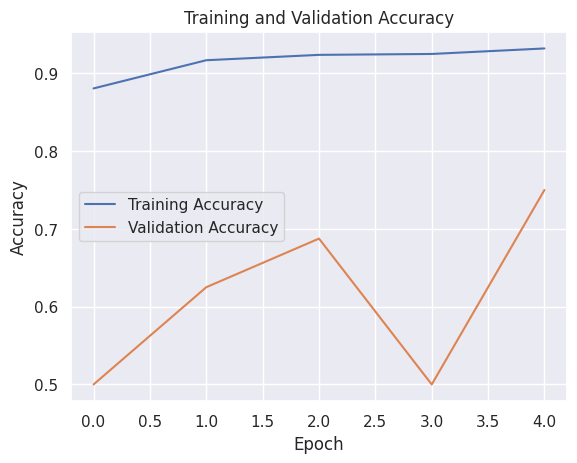

In [23]:
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()

# Lose Plot

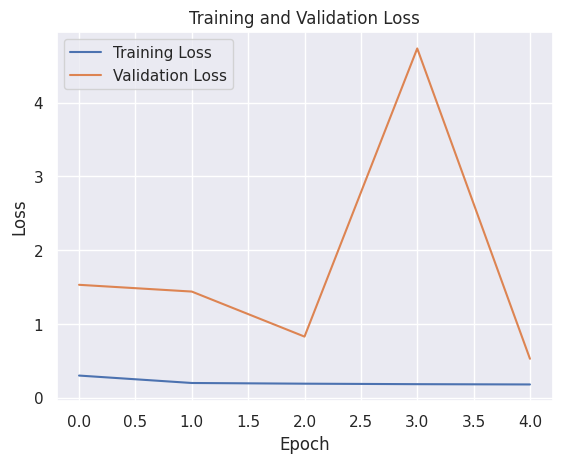

In [24]:
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

# Classification Report

In [25]:
from sklearn.metrics import classification_report, confusion_matrix

Y_pred = model1.predict(validation_generator)  
y_pred = np.argmax(Y_pred, axis=1)

# Print confusion matrix
print('Confusion Matrix')
print(confusion_matrix(validation_generator.classes, y_pred))

target_names = ['Normal', 'Pneumonia']
print('Classification Report')
print(classification_report(validation_generator.classes, y_pred, target_names=target_names))

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step
Confusion Matrix
[[4 4]
 [0 8]]
Classification Report
              precision    recall  f1-score   support

      Normal       1.00      0.50      0.67         8
   Pneumonia       0.67      1.00      0.80         8

    accuracy                           0.75        16
   macro avg       0.83      0.75      0.73        16
weighted avg       0.83      0.75      0.73        16



# Confusion Matrix

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━

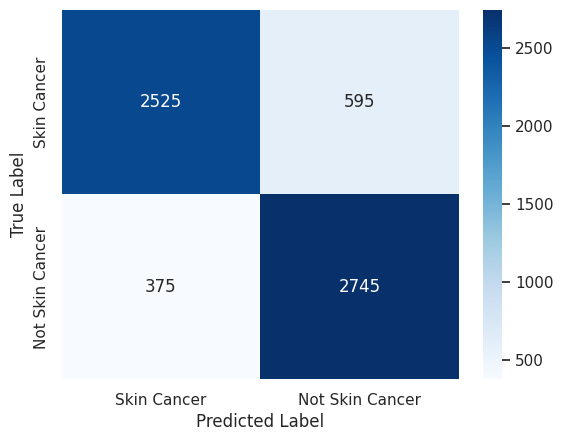

In [26]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import numpy as np

num_samples = 100
true_labels = []
predictions = []

for i, (x, y) in enumerate(test_generator):
    if i >= num_samples:
        break
    true_labels.extend(y)
    predictions.extend(model1.predict(x))

true_labels = np.concatenate(true_labels)
predictions = np.concatenate(predictions)
binary_predictions = np.round(predictions)

conf_mat = confusion_matrix(true_labels, binary_predictions)

sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', xticklabels=['Skin Cancer', 'Not Skin Cancer'], yticklabels=['Skin Cancer', 'Not Skin Cancer'])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()


# Specificity

In [27]:
def calculate_specificity(y_true, y_pred):
    true_negative = np.sum((y_true == 0) & (y_pred == 0))
    actual_negative = np.sum(y_true == 0)
    
    specificity = true_negative / actual_negative
    
    return specificity


specificity = calculate_specificity(true_labels, binary_predictions)
print("Specificity:", specificity)



Specificity: 0.8092948717948718


# ROC Curve

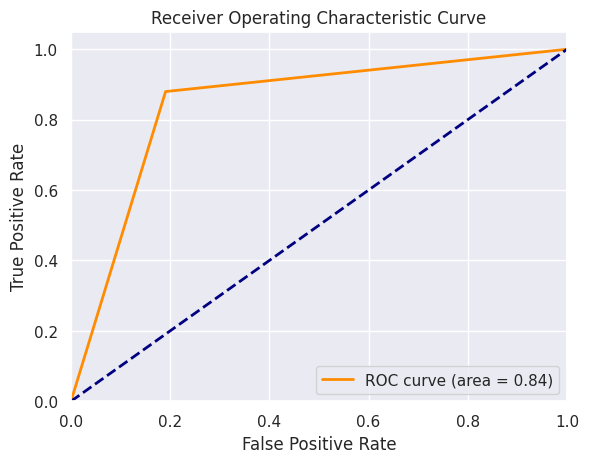

In [28]:
from sklearn.metrics import roc_curve, auc

fpr, tpr, _ = roc_curve(true_labels, binary_predictions)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic Curve')
plt.legend(loc="lower right")
plt.show()


# AUC

In [29]:
# Compute ROC curve and ROC area
fpr, tpr, thresholds = roc_curve(true_labels, binary_predictions)
roc_auc = auc(fpr, tpr)

print("AUC:", roc_auc)




AUC: 0.844551282051282


# Precision-Recall Curve

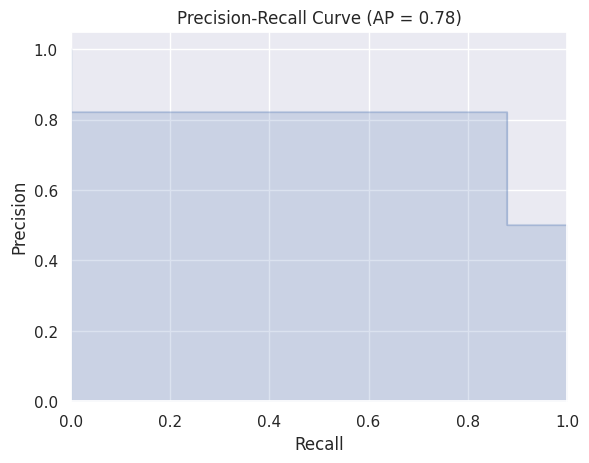

In [30]:
from sklearn.metrics import precision_recall_curve, average_precision_score


precision, recall, _ = precision_recall_curve(true_labels, binary_predictions)
average_precision = average_precision_score(true_labels, binary_predictions)

# Plot Precision-Recall curve
plt.figure()
plt.step(recall, precision, color='b', alpha=0.2, where='post')
plt.fill_between(recall, precision, step='post', alpha=0.2, color='b')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('Precision-Recall Curve (AP = %0.2f)' % average_precision)
plt.show()


# PR AUC

In [31]:
print("PR AUC:", average_precision)


PR AUC: 0.7831716374942422


# R2 Score Plot

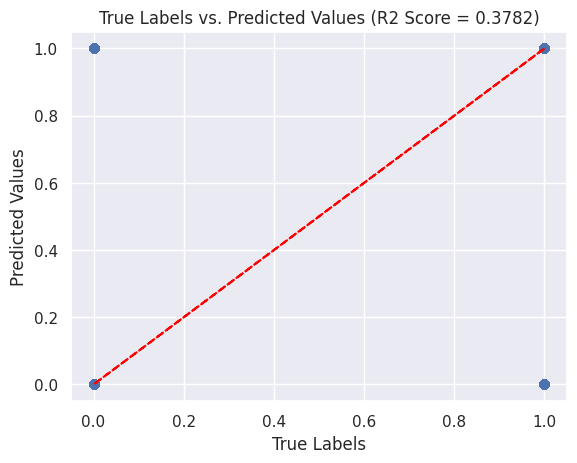

R2 Score: 0.3782051282051282


In [32]:
from sklearn.metrics import r2_score


r2 = r2_score(true_labels, binary_predictions)

# Plot true labels vs. predicted values
plt.figure()
plt.scatter(true_labels, binary_predictions, alpha=0.5)
plt.plot(true_labels, true_labels, color='red', linestyle='--')
plt.xlabel('True Labels')
plt.ylabel('Predicted Values')
plt.title('True Labels vs. Predicted Values (R2 Score = %.4f)' % r2)
plt.grid(True)
plt.show()

print("R2 Score:", r2)


# Calibration Curve

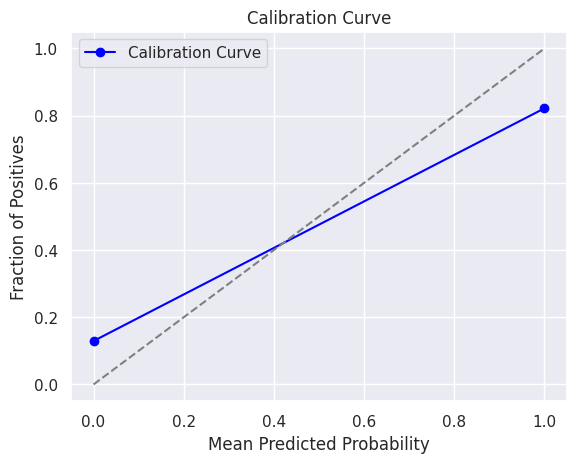

In [33]:
from sklearn.calibration import calibration_curve

prob_true, prob_pred = calibration_curve(true_labels, binary_predictions, n_bins=10)

# Plot calibration curve
plt.figure()
plt.plot(prob_pred, prob_true, marker='o', linestyle='-', color='blue', label='Calibration Curve')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('Mean Predicted Probability')
plt.ylabel('Fraction of Positives')
plt.title('Calibration Curve')
plt.legend()
plt.show()




# Brier Score

In [34]:
from sklearn.metrics import brier_score_loss

brier_score = brier_score_loss(true_labels, binary_predictions)

print("Brier Score:", brier_score)


Brier Score: 0.15544871794871795


# Grad-CAM

In [35]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.models import Model

In [36]:
def get_img_array(img_path, size):
    img = image.load_img(img_path, target_size=size)
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)
    return img_array

In [37]:
def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    grad_model = Model(model.inputs, [model.get_layer(last_conv_layer_name).output, model.output])
    
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]
    grads = tape.gradient(class_channel, last_conv_layer_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / tf.reduce_max(heatmap)
    return heatmap.numpy()

In [38]:
def display_gradcam(img_path, heatmap, alpha=0.4):
    # Load the original image
    img = image.load_img(img_path)
    img = image.img_to_array(img)
    
    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)
    
    # Apply heatmap to original image
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = heatmap * alpha + img
    
    # Save the image to disk
    cv2.imwrite('/content/gradcam.jpg', superimposed_img)
    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()


553467096/553467096 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


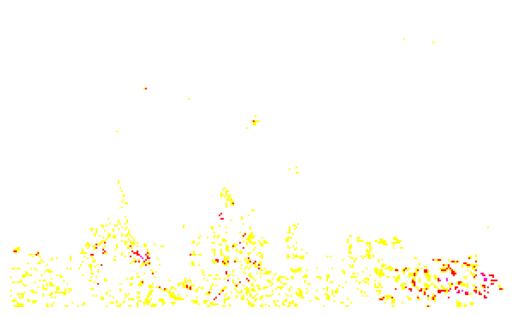

In [39]:
model = VGG16(weights='imagenet')

img_path = '/kaggle/input/edible-and-poisonous-mushroom-images/edible and poisonous mushroom/poisonous mushroom/poisonous_mushroom_02.jpg'

target_class_index = None

last_conv_layer_name = 'block5_conv3'

img_array = get_img_array(img_path, size=(224, 224))

heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name, target_class_index)

display_gradcam(img_path, heatmap)

# LIME

**Here, only 2D color images are supported. Therefore, I used another datasets image only for implementation purpose**

  0%|          | 0/1000 [00:00<?, ?it/s]

2024-05-15 19:37:55.457990: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 0: 4.17844, expected 3.56217
2024-05-15 19:37:55.458059: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 12: 3.52289, expected 2.90662
2024-05-15 19:37:55.458069: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 13: 4.66917, expected 4.05289
2024-05-15 19:37:55.458077: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 29: 4.67338, expected 4.0571
2024-05-15 19:37:55.458084: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 31: 4.6813, expected 4.06503
2024-05-15 19:37:55.458092: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 62: 4.79963, expected 4.18336
2024-05-15 19:37:55.458100: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 63: 4.73133, expected 4.11506
2024-05-15 19:37:55.458107: E external/local_xla/xl

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


W0000 00:00:1715801881.317932      93 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━

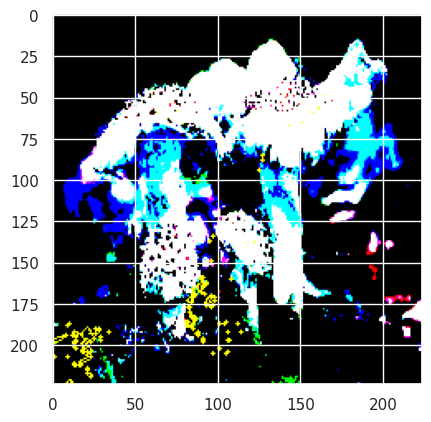

In [40]:
import lime
import lime.lime_image
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input, decode_predictions
from skimage.segmentation import mark_boundaries
from PIL import Image  # Import the Image module from PIL
import matplotlib.pyplot as plt
import numpy as np

model = VGG16(weights='imagenet')

explainer = lime.lime_image.LimeImageExplainer()

img = np.array(Image.open('/kaggle/input/edible-and-poisonous-mushroom-images/edible and poisonous mushroom/poisonous mushroom/poisonous_mushroom_02.jpg').resize((224, 224)))
img = preprocess_input(img)

explanation = explainer.explain_instance(img, model.predict, top_labels=5, hide_color=0, num_samples=1000)

temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=False)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))

In [41]:
for i in range(1):  # Top 5 labels
    print(f"\nExplanation for label {i+1}:")
    local_exp = explanation.local_exp[explanation.top_labels[i]]
    for feature, weight in local_exp:
        print(f"Feature: {feature}, Weight: {weight}")


Explanation for label 1:
Feature: 223, Weight: 4.01464892723177e-34
Feature: 279, Weight: 3.522216894409455e-34
Feature: 132, Weight: 3.4943265591997886e-34
Feature: 398, Weight: -3.3956818059263827e-34
Feature: 372, Weight: 3.369981933690872e-34
Feature: 343, Weight: -3.2064330287375903e-34
Feature: 345, Weight: 3.155711412976732e-34
Feature: 225, Weight: 3.1409782794195687e-34
Feature: 335, Weight: 3.133229307920481e-34
Feature: 145, Weight: 2.9368848752257816e-34
Feature: 272, Weight: 2.921810139382892e-34
Feature: 433, Weight: 2.859657763900804e-34
Feature: 1, Weight: -2.8221153259425677e-34
Feature: 89, Weight: 2.805203408829056e-34
Feature: 310, Weight: 2.7117254932979423e-34
Feature: 449, Weight: -2.6641745056002963e-34
Feature: 472, Weight: 2.649911459888086e-34
Feature: 255, Weight: 2.6014660472539906e-34
Feature: 506, Weight: -2.589857406306284e-34
Feature: 186, Weight: 2.58013406122838e-34
Feature: 120, Weight: 2.5247535010471873e-34
Feature: 27, Weight: 2.5032046747118622e

# Shap

In [42]:
#import shap
#from keras.applications.vgg16 import VGG16
#from keras.applications.vgg16 import preprocess_input
#from PIL import Image
#import matplotlib.pyplot as plt
#import numpy as np

#model = VGG16(weights='imagenet')

# Load and preprocess the image
#img = np.array(Image.open('/kaggle/input/edible-and-poisonous-mushroom-images/edible and poisonous mushroom/poisonous mushroom/poisonous_mushroom_02.jpg').resize((224, 224)))
#img = preprocess_input(img)

# Create an explainer object using SHAP
#explainer = shap.Explainer(model, preprocess_input)

# Generate SHAP values for the image with an increased max_evals value
#shap_values = explainer([img], max_evals=301057)

# Plot the SHAP values
#shap.image_plot(shap_values[0], -img)  # Extracting the first SHAP value for the image

# Feature Maps After MaxPooling

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


2024-05-15 19:38:24.572581: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 0: 4.42855, expected 3.64542
2024-05-15 19:38:24.572638: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 1: 5.87036, expected 5.08723
2024-05-15 19:38:24.572652: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 2: 6.04003, expected 5.2569
2024-05-15 19:38:24.572666: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 3: 6.22034, expected 5.43722
2024-05-15 19:38:24.572677: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 4: 4.90026, expected 4.11714
2024-05-15 19:38:24.572688: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 5: 5.21068, expected 4.42756
2024-05-15 19:38:24.572698: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 6: 5.92061, expected 5.13748
2024-05-15 19:38:24.572708: E external/local_xla/xla/ser

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 544ms/step


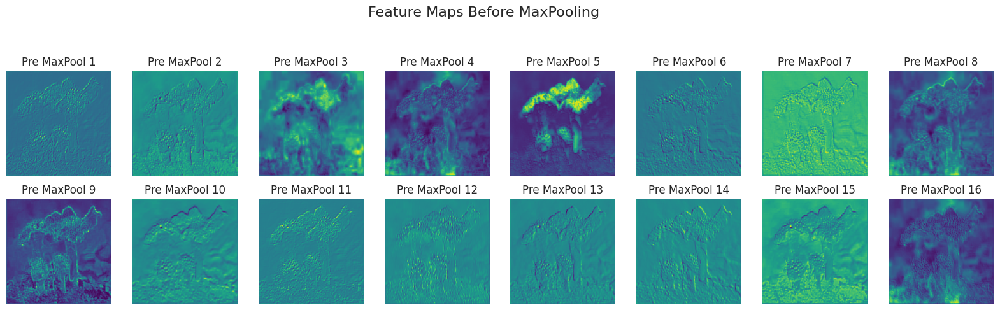

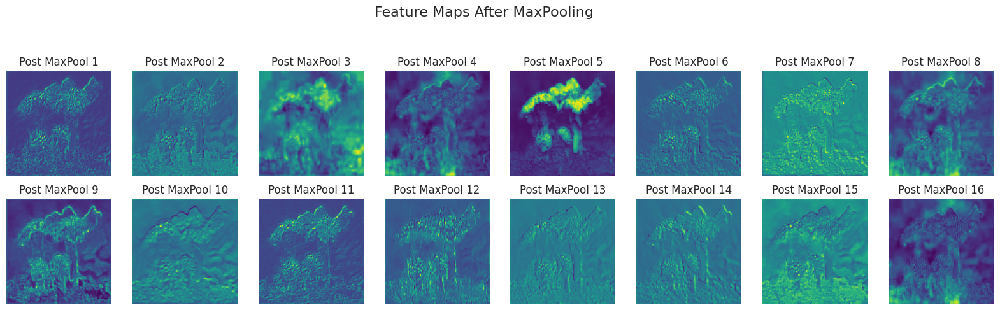

In [43]:
from tensorflow.keras.models import Model
from tensorflow.keras.applications import VGG16
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.models import Sequential

model = VGG16(weights='imagenet', include_top=False)

selected_layer_index = 2 

feature_extractor_model = Model(inputs=model.inputs, outputs=model.layers[selected_layer_index].output)

img_path = '/kaggle/input/edible-and-poisonous-mushroom-images/edible and poisonous mushroom/poisonous mushroom/poisonous_mushroom_02.jpg'
img = image.load_img(img_path, target_size=(224, 224))
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)
x = preprocess_input(x)

pre_maxpool_feature_maps = feature_extractor_model.predict(x)
post_maxpool_feature_maps = MaxPooling2D(pool_size=(2, 2), strides=(2, 2))(pre_maxpool_feature_maps)

plt.figure(figsize=(20, 10))
for i in range(16):  
    plt.subplot(4, 8, i + 1)
    plt.imshow(pre_maxpool_feature_maps[0, :, :, i], cmap='viridis')
    plt.axis('off')
    plt.title(f'Pre MaxPool {i+1}')
plt.suptitle('Feature Maps Before MaxPooling', fontsize=16)
plt.show()

plt.figure(figsize=(20, 10))
for i in range(16):  
    plt.subplot(4, 8, i + 1)
    plt.imshow(post_maxpool_feature_maps[0, :, :, i], cmap='viridis')
    plt.axis('off')
    plt.title(f'Post MaxPool {i+1}')
plt.suptitle('Feature Maps After MaxPooling', fontsize=16)
plt.show()


# CNN Model 2

In [44]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, Dropout, BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import RMSprop, Adam
from tensorflow.keras.utils import to_categorical
from sklearn.metrics import classification_report, confusion_matrix

model2 = Sequential()

model2.add(Conv2D(filters=8, kernel_size=(7,7), padding='same', activation='relu', input_shape=(150, 150, 3)))
model2.add(Conv2D(filters=8, kernel_size=(7,7), padding='same', activation='relu'))
model2.add(MaxPooling2D(pool_size=(3,3)))

model2.add(Conv2D(filters=16, kernel_size=(5,5), padding='same', activation='relu'))
model2.add(Conv2D(filters=16, kernel_size=(5,5), padding='same', activation='relu'))
model2.add(MaxPooling2D(pool_size=(3,3)))

model2.add(Conv2D(filters=32, kernel_size=(3,3), padding='same', activation='relu'))
model2.add(Conv2D(filters=32, kernel_size=(3,3), padding='same', activation='relu'))
model2.add(MaxPooling2D(pool_size=(2,2)))

model2.add(Conv2D(filters=64, kernel_size=(3,3), padding='same', activation='relu'))
model2.add(Conv2D(filters=64, kernel_size=(3,3), padding='same', activation='relu'))
model2.add(MaxPooling2D(pool_size=(2,2)))

model2.add(Conv2D(filters=128, kernel_size=(3,3), padding='same', activation='relu'))
model2.add(Conv2D(filters=128, kernel_size=(3,3), padding='same', activation='relu'))
model2.add(MaxPooling2D(pool_size=(2,2)))

model2.add(Flatten())

model2.add(Dense(128, activation='relu'))
model2.add(Dropout(0.2))
model2.add(Dense(2, activation='sigmoid'))

optimizer = Adam(learning_rate=0.0001, decay=1e-5)
model2.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])



In [45]:
import time

start = time.time()

callbacks = myCallback()
history2 = model2.fit( train_generator, 
                  validation_data = validation_generator, 
                  epochs = 5,  
                  callbacks=[callbacks]
                 
                 )

end = time.time()
elapsed = end - start
print("Total Time:", elapsed)

Epoch 1/5
163/163 ━━━━━━━━━━━━━━━━━━━━ 81s 418ms/step - accuracy: 0.7272 - loss: 0.6042 - val_accuracy: 0.5000 - val_loss: 0.6946
Epoch 2/5
163/163 ━━━━━━━━━━━━━━━━━━━━ 69s 406ms/step - accuracy: 0.7802 - loss: 0.4713 - val_accuracy: 0.5000 - val_loss: 0.7009
Epoch 3/5
163/163 ━━━━━━━━━━━━━━━━━━━━ 70s 408ms/step - accuracy: 0.8590 - loss: 0.3120 - val_accuracy: 0.5000 - val_loss: 0.7087
Epoch 4/5
163/163 ━━━━━━━━━━━━━━━━━━━━ 70s 410ms/step - accuracy: 0.8861 - loss: 0.2625 - val_accuracy: 0.5000 - val_loss: 0.7331
Epoch 5/5
163/163 ━━━━━━━━━━━━━━━━━━━━ 70s 411ms/step - accuracy: 0.9046 - loss: 0.2275 - val_accuracy: 0.5000 - val_loss: 0.7302
Total Time: 360.71596932411194


In [46]:
loss, accuracy = model2.evaluate(validation_generator)
print("Accuracy score:", accuracy)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - accuracy: 0.5000 - loss: 0.7302
Accuracy score: 0.5


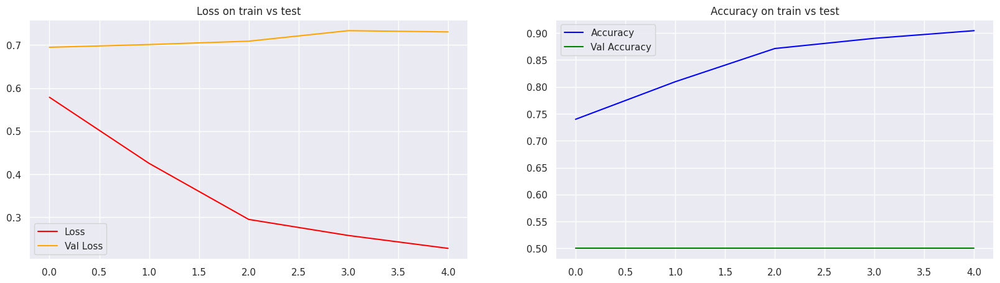

In [47]:
plt.figure(figsize=(20,5))

# plot loss & val loss
plt.subplot(1,2,1)
sns.lineplot(x=history2.epoch, y=history2.history['loss'], color='red', label='Loss')
sns.lineplot(x=history2.epoch, y=history2.history['val_loss'], color='orange', label='Val Loss')
plt.title('Loss on train vs test')
plt.legend(loc='best')

# plot accuracy and val accuracy
plt.subplot(1,2,2)
sns.lineplot(x=history2.epoch, y=history2.history['accuracy'], color='blue', label='Accuracy')
sns.lineplot(x=history2.epoch, y=history2.history['val_accuracy'], color='green', label='Val Accuracy')
plt.title('Accuracy on train vs test')
plt.legend(loc='best')

plt.show()

# CNN Model 3

In [48]:
import tensorflow as tf
from tensorflow.keras import layers, models, regularizers

model3 = tf.keras.Sequential()

model3.add(layers.Conv2D(filters=16, kernel_size=(3,3), strides=(1,1), activation=tf.nn.relu, input_shape=(150,150,3)))
model3.add(layers.MaxPool2D())

model3.add(layers.Conv2D(filters=32, kernel_size=(3,3), strides=(1,1), activation=tf.nn.relu))
model3.add(layers.MaxPool2D())

model3.add(layers.Conv2D(filters=16, kernel_size=(3,3), strides=(1,1), activation=tf.nn.relu))
model3.add(layers.MaxPool2D())

model3.add(layers.Flatten())
model3.add(layers.Dense(256, activation='relu'))
model3.add(layers.Dense(2, activation=tf.nn.sigmoid))

In [49]:
print(model3.summary())


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_10 (Conv2D)              │ (None, 148, 148, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 74, 74, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 72, 72, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 36, 36, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 34, 34, 16)     │         4,624 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 17, 17, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 4624)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 256)            │     1,184,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 2)              │           514 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,194,226 (4.56 MB)

 Trainable params: 1,194,226 (4.56 MB)

 Non-trainable params: 0 (0.00 B)

None


In [50]:
model3.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

In [51]:
from tensorflow.keras import callbacks


early_stopping = callbacks.EarlyStopping(monitor='val_loss', patience=5)

In [52]:
history3 = model3.fit(train_generator,
                    epochs=3,
                    validation_data=validation_generator,
                    callbacks=[early_stopping])

Epoch 1/3
163/163 ━━━━━━━━━━━━━━━━━━━━ 75s 423ms/step - accuracy: 0.7658 - loss: 0.5672 - val_accuracy: 0.5625 - val_loss: 0.6708
Epoch 2/3
163/163 ━━━━━━━━━━━━━━━━━━━━ 70s 413ms/step - accuracy: 0.8943 - loss: 0.2422 - val_accuracy: 0.5625 - val_loss: 0.6098
Epoch 3/3
163/163 ━━━━━━━━━━━━━━━━━━━━ 70s 410ms/step - accuracy: 0.9041 - loss: 0.2230 - val_accuracy: 0.7500 - val_loss: 0.5017


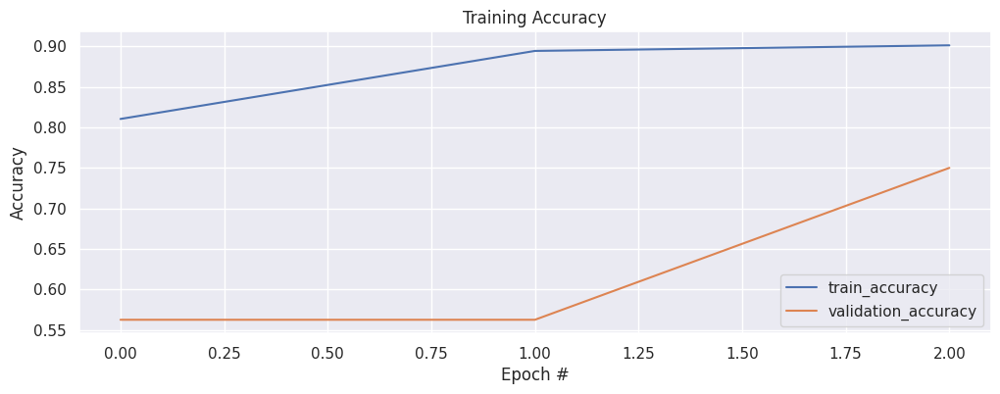

In [53]:
num_epochs = 3

train_accuracy = history3.history['accuracy'][:num_epochs]
val_accuracy = history3.history['val_accuracy'][:num_epochs]

train_accuracy += [None] * (num_epochs - len(train_accuracy))
val_accuracy += [None] * (num_epochs - len(val_accuracy))

plt.figure(figsize=(12, 4))
plt.plot(np.arange(0, num_epochs), train_accuracy, label='train_accuracy')
plt.plot(np.arange(0, num_epochs), val_accuracy, label='validation_accuracy')

plt.title('Training Accuracy')
plt.xlabel("Epoch #")
plt.ylabel("Accuracy")
plt.legend(loc="lower right")
plt.show()

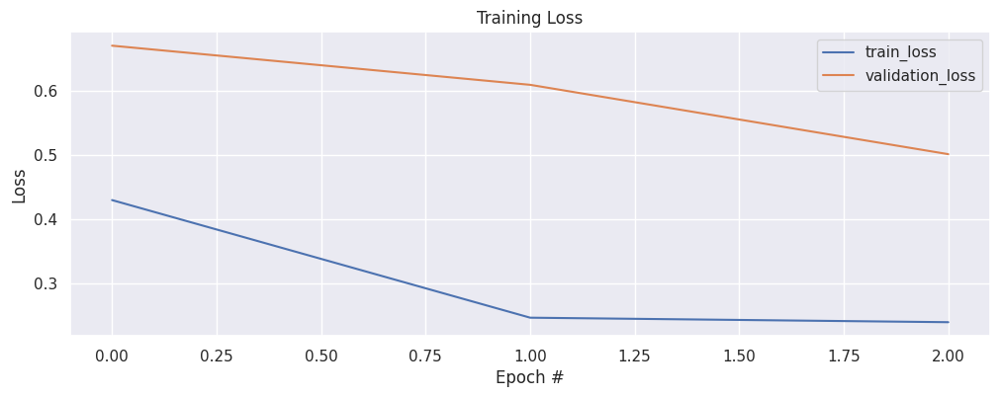

In [54]:


num_epochs = 3

train_loss = history3.history['loss'][:num_epochs]
val_loss = history3.history['val_loss'][:num_epochs]

train_loss += [None] * (num_epochs - len(train_loss))
val_loss += [None] * (num_epochs - len(val_loss))

plt.figure(figsize=(12, 4))
plt.plot(np.arange(0, num_epochs), train_loss, label='train_loss')
plt.plot(np.arange(0, num_epochs), val_loss, label='validation_loss')

plt.title('Training Loss')
plt.xlabel("Epoch #")
plt.ylabel("Loss")
plt.legend(loc="upper right")
plt.show()

In [55]:
loss, accuracy = model3.evaluate(validation_generator)
print(f'Test Loss: {loss}')
print(f'Test Accuracy: {accuracy}')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - accuracy: 0.7500 - loss: 0.5017
Test Loss: 0.5017440319061279
Test Accuracy: 0.75


# Xception model

In [56]:
from keras import applications
from keras.layers import Input
from keras.models import Model


xcep_base = applications.Xception(weights = 'imagenet', include_top = False, input_shape = (150, 150, 3))
xcep_base.trainable = False

inputs = Input(shape=(150, 150, 3))

x = xcep_base(inputs, training=False)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(1024, activation = 'relu')(x)
x = layers.Dropout(0.5)(x)
outputs = layers.Dense(2, activation = 'sigmoid')(x)
xcep_model = Model(inputs, outputs)

83683744/83683744 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [57]:
from tensorflow import keras

xcep_model.compile(
    optimizer=keras.optimizers.Adam(),
    loss= keras.losses.BinaryCrossentropy(from_logits = True),
    metrics= [keras.metrics.CategoricalAccuracy()],
)


epochs = 1
xcep_model.fit(train_generator, epochs=epochs, validation_data=validation_generator)

  1/163 ━━━━━━━━━━━━━━━━━━━━ 39:34 15s/step - categorical_accuracy: 0.8125 - loss: 0.5441

W0000 00:00:1715802516.987179      94 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


163/163 ━━━━━━━━━━━━━━━━━━━━ 86s 439ms/step - categorical_accuracy: 0.8848 - loss: 0.3619 - val_categorical_accuracy: 0.7500 - val_loss: 0.4688


In [58]:
test_loss, test_acc = xcep_model.evaluate(test_generator, verbose=0)
print('\naccuracy:', test_acc, '  loss: ',test_loss)

W0000 00:00:1715802592.120221      94 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update



accuracy: 0.8477563858032227   loss:  0.37381914258003235


# ResNet50

In [59]:
from keras.applications import ResNet50
from keras.layers import Input, GlobalAveragePooling2D, Dense, Dropout
from keras.models import Model

resnet_base = ResNet50(weights='imagenet', include_top=False, input_shape=(150, 150, 3))
resnet_base.trainable = False

inputs = Input(shape=(150, 150, 3))

x = resnet_base(inputs, training=False)
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)
outputs = Dense(2, activation='sigmoid')(x)
resnet_model = Model(inputs, outputs)

resnet_model.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy']
)

resnet_model.fit(train_generator, epochs=1, validation_data=validation_generator)

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
  1/163 ━━━━━━━━━━━━━━━━━━━━ 43:44 16s/step - accuracy: 0.5625 - loss: 0.7408

W0000 00:00:1715802616.314332      95 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


163/163 ━━━━━━━━━━━━━━━━━━━━ 88s 441ms/step - accuracy: 0.7220 - loss: 0.6189 - val_accuracy: 0.5000 - val_loss: 0.7889


In [60]:
test_loss, test_acc = resnet_model.evaluate(test_generator, verbose=0)
print('\naccuracy:', test_acc, '  loss: ',test_loss)

W0000 00:00:1715802691.908117      94 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update



accuracy: 0.625   loss:  0.6146925687789917


# MobileNetV2

In [61]:
from keras.applications import MobileNetV2
from keras.layers import Input, GlobalAveragePooling2D, Dense, Dropout
from keras.models import Model

mobilenet_base = MobileNetV2(weights='imagenet', include_top=False, input_shape=(150, 150, 3))
mobilenet_base.trainable = False

inputs = Input(shape=(150, 150, 3))

x = mobilenet_base(inputs, training=False)
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)
outputs = Dense(2, activation='sigmoid')(x)
mobilenet_model = Model(inputs, outputs)

mobilenet_model.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy']
)

mobilenet_model.fit(train_generator, epochs=1, validation_data=validation_generator)

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
163/163 ━━━━━━━━━━━━━━━━━━━━ 85s 438ms/step - accuracy: 0.8500 - loss: 0.4599 - val_accuracy: 0.7500 - val_loss: 0.4022


In [62]:
test_loss, test_acc = mobilenet_model.evaluate(test_generator, verbose=0)
print('\naccuracy:', test_acc, '  loss: ',test_loss)


accuracy: 0.8605769276618958   loss:  0.30756449699401855


# VGG16

In [63]:
from keras.applications import VGG16
from keras.layers import Input, GlobalAveragePooling2D, Dense, Dropout
from keras.models import Model

vgg_base = VGG16(weights='imagenet', include_top=False, input_shape=(150, 150, 3))
vgg_base.trainable = False

inputs = Input(shape=(150, 150, 3))

x = vgg_base(inputs, training=False)
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)
outputs = Dense(2, activation='sigmoid')(x)
vgg_model = Model(inputs, outputs)

vgg_model.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy']
)

vgg_model.fit(train_generator, epochs=1, validation_data=validation_generator)


2024-05-15 19:53:20.715441: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 0: 4.18794, expected 3.54228
2024-05-15 19:53:20.715507: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 3: 5.14647, expected 4.50081
2024-05-15 19:53:20.715520: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 8: 5.30074, expected 4.65509
2024-05-15 19:53:20.715533: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 9: 4.91575, expected 4.27009
2024-05-15 19:53:20.715556: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 10: 3.57367, expected 2.92801
2024-05-15 19:53:20.715568: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 11: 4.05899, expected 3.41334
2024-05-15 19:53:20.715578: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 12: 5.27592, expected 4.63026
2024-05-15 19:53:20.715589: E external/local_xla/xla

162/163 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step - accuracy: 0.8279 - loss: 0.3724

2024-05-15 19:54:36.971684: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 13949: 2.55788, expected 2.19131
2024-05-15 19:54:36.971900: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 45000: 4.27818, expected 3.64025
2024-05-15 19:54:36.971913: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 45002: 5.33515, expected 4.69721
2024-05-15 19:54:36.971921: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 45003: 4.90498, expected 4.26705
2024-05-15 19:54:36.971928: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 45009: 4.74986, expected 4.11192
2024-05-15 19:54:36.971936: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 45010: 4.24757, expected 3.60963
2024-05-15 19:54:36.971943: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 45011: 4.15995, expected 3.52201
2024-05-15 19:54:36.971951:

163/163 ━━━━━━━━━━━━━━━━━━━━ 87s 446ms/step - accuracy: 0.8286 - loss: 0.3712 - val_accuracy: 0.8125 - val_loss: 0.3786


In [64]:
test_loss, test_acc = vgg_model.evaluate(test_generator, verbose=0)
print('\naccuracy:', test_acc, '  loss: ',test_loss)


accuracy: 0.8044871687889099   loss:  0.4452840983867645


# InceptionV3

In [65]:
from keras.applications import InceptionV3
from keras.layers import Input, GlobalAveragePooling2D, Dense, Dropout
from keras.models import Model

inception_base = InceptionV3(weights='imagenet', include_top=False, input_shape=(150, 150, 3))
inception_base.trainable = False

inputs = Input(shape=(150, 150, 3))

x = inception_base(inputs, training=False)
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)
outputs = Dense(2, activation='sigmoid')(x)
inception_model = Model(inputs, outputs)

inception_model.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy']
)

inception_model.fit(train_generator, epochs=1, validation_data=validation_generator)

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
  1/163 ━━━━━━━━━━━━━━━━━━━━ 56:33 21s/step - accuracy: 0.4375 - loss: 1.3706

W0000 00:00:1715802914.126321      92 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


163/163 ━━━━━━━━━━━━━━━━━━━━ 96s 464ms/step - accuracy: 0.8288 - loss: 1.0139 - val_accuracy: 0.8750 - val_loss: 0.3955


In [66]:
test_loss, test_acc = inception_model.evaluate(test_generator, verbose=0)
print('\naccuracy:', test_acc, '  loss: ',test_loss)

W0000 00:00:1715802995.510227      94 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update



accuracy: 0.8365384340286255   loss:  0.40064096450805664


# DenseNet121

In [67]:
from keras.applications import DenseNet121
from keras.layers import Input, GlobalAveragePooling2D, Dense, Dropout
from keras.models import Model

densenet_base = DenseNet121(weights='imagenet', include_top=False, input_shape=(150, 150, 3))
densenet_base.trainable = False

inputs = Input(shape=(150, 150, 3))

x = densenet_base(inputs, training=False)
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)
outputs = Dense(2, activation='sigmoid')(x)
densenet_model = Model(inputs, outputs)

densenet_model.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy']
)

densenet_model.fit(train_generator, epochs=1, validation_data=validation_generator)

29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
163/163 ━━━━━━━━━━━━━━━━━━━━ 115s 510ms/step - accuracy: 0.8496 - loss: 0.4728 - val_accuracy: 0.8750 - val_loss: 0.4426


In [68]:
test_loss, test_acc = densenet_model.evaluate(test_generator, verbose=0)
print('\naccuracy:', test_acc, '  loss: ',test_loss)


accuracy: 0.8637820482254028   loss:  0.38429519534111023


# NASNetMobile

In [69]:
from keras.applications import NASNetMobile
from keras.layers import Input, GlobalAveragePooling2D, Dense, Dropout
from keras.models import Model

nasnet_base = NASNetMobile(weights='imagenet', include_top=False, input_shape=(150, 150, 3))
nasnet_base.trainable = False

inputs = Input(shape=(150, 150, 3))

x = nasnet_base(inputs, training=False)
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)
outputs = Dense(2, activation='sigmoid')(x)
nasnet_model = Model(inputs, outputs)

nasnet_model.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy']
)

nasnet_model.fit(train_generator, epochs=1, validation_data=validation_generator)

19993432/19993432 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
163/163 ━━━━━━━━━━━━━━━━━━━━ 122s 519ms/step - accuracy: 0.8449 - loss: 0.3730 - val_accuracy: 0.6875 - val_loss: 0.4564


In [70]:
test_loss, test_acc = nasnet_model.evaluate(test_generator, verbose=0)
print('\naccuracy:', test_acc, '  loss: ',test_loss)


accuracy: 0.8108974099159241   loss:  0.46602270007133484


# End!!! Thanks for watching. It's only for my learning purpose.